In [1]:
import numpy as np

In [3]:
# import some example data

# what can we do here?

# 1. plot the data

from gaitlink.data import LabExampleDataset


example_data = LabExampleDataset()

# You can select the data you want using the 'get_subset' method
ha_data = example_data.get_subset(cohort='HA')

In [4]:
ha_data

,cohort,participant_id,time_measure,test,trial
0,HA,001,TimeMeasure1,Test5,Trial1
1,HA,001,TimeMeasure1,Test5,Trial2
2,HA,001,TimeMeasure1,Test11,Trial1
3,HA,002,TimeMeasure1,Test5,Trial1
4,HA,002,TimeMeasure1,Test5,Trial2
5,HA,002,TimeMeasure1,Test11,Trial1


In [82]:
# Once you have selected only a single row of the dataset (either by repeated ''get_subset'') or by iteration, you can load the actual data.
single_test = ha_data.get_subset(participant_id = "002", test = "Test11", trial = "Trial1")
single_test

,cohort,participant_id,time_measure,test,trial
0,HA,002,TimeMeasure1,Test11,Trial1


In [83]:
# the raw IMU data:
imu_data = single_test.data["LowerBack"]
imu_data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z
time,,,,,,
2020-08-21 10:50:00.388000+00:00,9.506652,0.014721,-1.251681,0.7467,0.0411,-0.2598
2020-08-21 10:50:00.398000128+00:00,9.508550,-0.003995,-1.255758,0.7143,-0.2051,-0.2739
2020-08-21 10:50:00.408000+00:00,9.522865,0.010142,-1.287486,0.5649,-0.0735,-0.4197
2020-08-21 10:50:00.417999872+00:00,9.509657,0.024649,-1.293958,0.3432,-0.0719,-0.2773
2020-08-21 10:50:00.428000+00:00,9.498548,0.053690,-1.239242,0.2914,-0.0606,-0.3616
...,...,...,...,...,...,...
2020-08-21 10:52:40.177999872+00:00,9.561574,0.635956,0.264192,-0.1136,-0.9987,-0.4929
2020-08-21 10:52:40.188000+00:00,9.588995,0.647659,0.269060,0.4132,-1.2662,-0.5346
2020-08-21 10:52:40.197999872+00:00,9.613343,0.659560,0.249716,0.5845,-1.0722,-0.2816


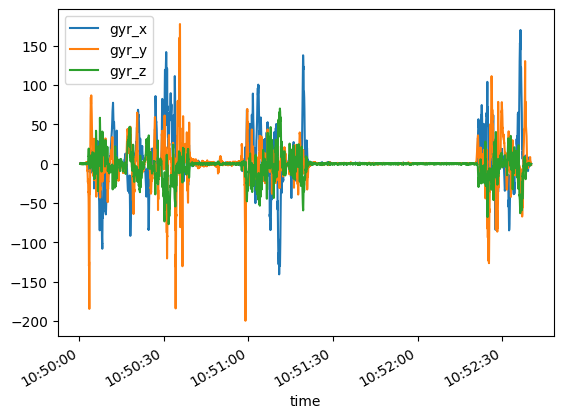

In [84]:
import matplotlib.pyplot as plt
imu_data.filter(like="gyr").plot()
plt.show()

In [85]:
# Loading the reference system metadata
# You can do this by specifying the "reference_system" argument
example_data_with_reference = LabExampleDataset(reference_system="Stereophoto")
single_trial_with_reference = example_data_with_reference.get_subset(cohort = "HA",
                                                                     participant_id = "002",
                                                                     test = "Test11",
                                                                     trial = "Trial1")

single_trial_with_reference.reference_parameters_["lwb"][0]

# from here you need InitialContact_Event and InitialContact_LeftRight
# single_trial_with_reference.reference_parameters_["lwb"][0]["InitialContact_LeftRight"]

{'Start': 4.85,
 'End': 10.13,
 'StrideFrequency': 36.005867135487954,
 'Cadence': 72.01173427097591,
 'Duration': 5.28,
 'Length': array([], dtype=float64),
 'LengthFeet': array([], dtype=float64),
 'WalkingSpeed': 0.6156831674183773,
 'AverageStrideLength': 1.0226696663866188,
 'NumberStrides': 6.0,
 'TerminationReason': 'Pause',
 'Break_Start': array([], dtype=float64),
 'Break_End': array([], dtype=float64),
 'Break_Number': array([], dtype=float64),
 'Break_Duration': array([], dtype=float64),
 'Turning_Flag': 1.0,
 'Turn_Start': 6.24,
 'Turn_End': 10.0,
 'Turn_Number': 1.0,
 'Turn_Angle': -184.8880408729617,
 'Turn_Duration': 3.76,
 'Turn_NumberStrides': 6.0,
 'Turn_AngularVelocity': array([  6.16395108,   3.41540686,   0.56600537,  -2.37289255,
         -5.38933531,  -8.47085684, -11.60455886, -14.77719841,
        -17.97528016, -21.18515269, -24.3931079 , -27.5854828 ,
        -30.74876259, -33.86968419, -36.93533901, -39.93327408,
        -42.85159024, -45.6790364 , -48.405098

In [86]:
# The reference initial contacts are obtained from
# 'InitialContact_Event': array([2.28, 2.96, 3.56, 4.14, 4.72, 5.39]),
# 'InitialContact_LeftRight': array(['Left', 'Right', 'Left', 'Right', 'Left', 'Right'], dtype=object)

print(single_trial_with_reference.reference_parameters_["lwb"][0]["InitialContact_Event"])
print(single_trial_with_reference.reference_parameters_["lwb"][0]["InitialContact_LeftRight"])

# TODO: what are those time points? are these seconds?
# Answer: yes, or because the data is sampled at 100Hz, if you multiply by sampling rate, you will get the sample no.

[ 4.85  5.64  6.29   nan  7.42  7.78  9.49 10.13]
['Right' 'Left' 'Right' 'Left' 'Right' 'Left' 'Left' 'Right']


In [87]:
# what is the sampling rate?
sample_rate = 1/ ((imu_data.index.microsecond[1] - imu_data.index.microsecond[0]) * 1e-6)
sample_rate


100.0

In [88]:
imu_data.loc[:, "acc_x"] # this is a data frame, shall we convert it to a numpy array?

time
2020-08-21 10:50:00.388000+00:00       9.506652
2020-08-21 10:50:00.398000128+00:00    9.508550
2020-08-21 10:50:00.408000+00:00       9.522865
2020-08-21 10:50:00.417999872+00:00    9.509657
2020-08-21 10:50:00.428000+00:00       9.498548
                                         ...   
2020-08-21 10:52:40.177999872+00:00    9.561574
2020-08-21 10:52:40.188000+00:00       9.588995
2020-08-21 10:52:40.197999872+00:00    9.613343
2020-08-21 10:52:40.208000+00:00       9.617620
2020-08-21 10:52:40.217999872+00:00    9.605131
Name: acc_x, Length: 15984, dtype: float64

In [89]:
data = imu_data.iloc[:, :].to_numpy()
data.shape

# essentially, we do not care about datetime, it was decided to work sample-wise


(15984, 6)

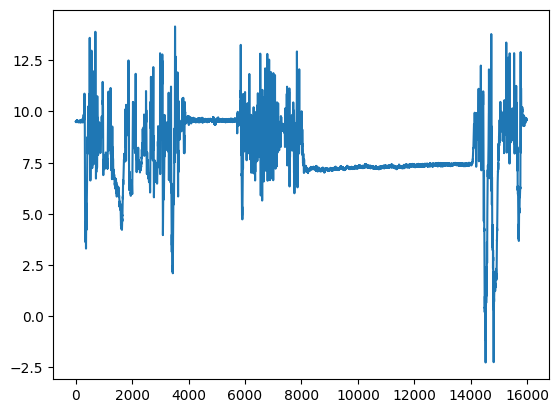

In [98]:
plt.plot(data[:, 0])
ics = single_trial_with_reference.reference_parameters_["lwb"][0]["InitialContact_Event"]
ground_truth = single_trial_with_reference.reference_parameters_["lwb"][0]["InitialContact_LeftRight"]

array(['Right', 'Left', 'Right', 'Left', 'Right', 'Left', 'Left', 'Right'],
      dtype=object)

In [91]:
ics * sample_rate

array([ 485.,  564.,  629.,   nan,  742.,  778.,  949., 1013.])

In [96]:
ics 
# ics - this is measured in seconds, ics * sample_rate = sample_location

array([ 4.85,  5.64,  6.29,   nan,  7.42,  7.78,  9.49, 10.13])

In [97]:
ground_truth == 'Left'

array([False,  True, False,  True, False,  True,  True, False])

### McCamley Algo implementation
____
#### Part 1 - the original implementation

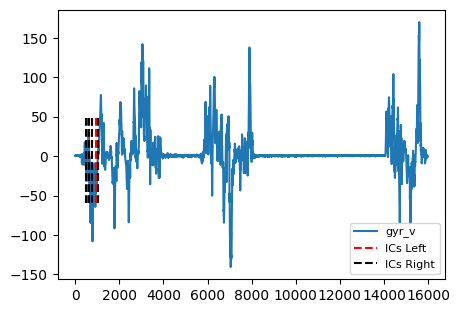

In [95]:
plt.figure(figsize = (5, 3.5))
plt.plot(data[:, 3], label = 'gyr_v')
plt.vlines(ics[ground_truth == 'Left'] * sample_rate, ymin = -60, ymax = 50, color = 'r', linestyles='--', label = 'ICs Left')
plt.vlines(ics[ground_truth == 'Right'] * sample_rate, ymin = -60, ymax = 50, color = 'k', linestyles='--', label = 'ICs Right')
plt.legend(fontsize = 8)

In [ ]:
# ok, so this is not working as expected for more complex data, with turns in between and maybe resting breaks.

In [48]:
# utilities
from scipy.signal import butter, filtfilt

def butter_lowpass_filter(data, cutoff, sampling_rate_hz, order = 4):
    """Create and apply a Butterworh lowpass filter"""
    nyq = 0.5 * sampling_rate_hz
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype = "low", analog=False)
    y = filtfilt(b, a, data)
    return y

def butter_bandpass_filter(data, lower_bound, upper_bound, sampling_rate_hz, order = 4):
    """Create and apply a Butterworh bandpass filter"""
    nyq = 0.5 * sampling_rate_hz
    normal_lower_bound = lower_bound / nyq
    normal_upper_bound = upper_bound / nyq
    b, a = butter(order, [normal_lower_bound, normal_upper_bound], btype="bandpass", analog=False)
    y = filtfilt(b, a, data)
    return y

781
[227 296 356 413 472 539]
['L' 'L' 'L' 'L' 'L' 'R']


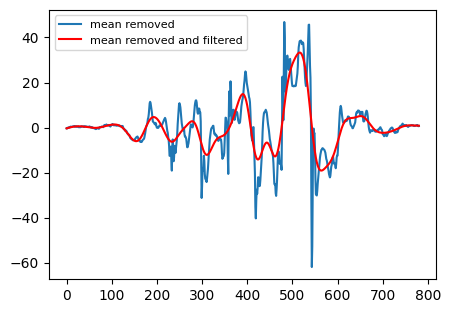

In [81]:
# how about other data?



signal = imu_data.loc[:, 'gyr_x'].to_numpy() 
print(len(signal))
ic_list_samples = np.round((ics * sample_rate).astype(int))
print(ic_list_samples)

# due to rounding errors the last two ICs might need to be shifted backwards
if ic_list_samples[-1] > len(signal):
    print('edge case 1')
    ic_list_samples[-1] = len(signal)-1

if len(ic_list_samples) >= 2 and ic_list_samples[-2] >= len(sig):
    print('edge case 2')
    ic_list_samples[-2] = len(signal)-2
    
sig = signal - np.mean(signal)
cutoff_freq = 2
sig_filtered = butter_lowpass_filter(sig, cutoff= cutoff_freq, sampling_rate_hz= sample_rate)

plt.figure(figsize = (5, 3.5))
plt.plot(sig, label = 'mean removed')
plt.plot(sig_filtered, 'r-', label = 'mean removed and filtered')
plt.legend(fontsize = 8)

ic_left_right = np.where(sig_filtered[ic_list_samples] <=0, "L", "R")
print(ic_left_right)

# ok, so this is shit

In [ ]:
trying out the band pass filter

In [ ]:
def identify_left_right_McCamley(signal, ic_list, sampling_rate, algorithm_string, options):
    """
    Write docs here
    """
    if algorithm_string.upper() == "ORIGINAL":
        if options.upper() == "YAW" or options.upper() == "V" or options.upper == "VERTICAL":
            ic_list_samples = np.round(ic_list * sampling_rate).astype(int)
            
            # due to rounding errors, the last two ICs might need to be shifted backwards.
        else:
            raise ValueError("Invalid option choice for the original implementation of the McCamley algorithm. Please select either .. or ..")
    elif algorithm_string.upper() == "Adaptive":
        a = []
    else:
        raise ValueError("Invalid algorithm choice. Input must be 'original' or 'adaptive'")
    return a

In [ ]:

# inputs for the McCamley algo:
# signal, ic_list, samplig_rate, algo_string

algorithm_string = "McCamley-yaw" #or "McCamley-Yaw" or "McCamley-v" # this is around the vertical axis
# algorithm_string = "McCampley-roll" # this is around the ap axis

"yaw" in algorithm_string.split("-")

# this is the original setup, taking the gyr_v into account (the yaw angle)

signal = imu_data.loc[:, 'gyr_x'].to_numpy() 

# ----------------------------------------------------
# Here it stats:
# ----------------------------------------------------
# Perform left/right identification given the signal and the ic_list

ic_list_samples = np.round(ics * sample_rate).astype(int)

# due to rounding errors, the last two ICs might need to be shifted backwards

if ic_list_samples[-1] >= len(signal):
    ic_list_samples[-1] = len(signal) -1
    
if len(ic_list_samples) >=2 and ic_list_samples[-2] >= len(signal):
    ic_list_samples[-2] = len(signal) - 2

# deprecated original version: subtract mean and use lowpass filter: this could be applied in can an "-original" is put into the algorithm string, but was not used for the technical validation study (TVS)

sig = signal - np.mean(signal)
cutoff_freq = 2
sig_filtered = butter_lowpass_filter(sig, cutoff_freq, sample_rate)

ic_left_right = np.where(sig_filtered[ic_list_samples] <= 0, "L", "R")

# TODO: is there a definition already implemented fot the Butterworth filter?
# TODO: can we have an utility toolbox that might benefit from this?

In [44]:
print(ic_left_right)
print(ground_truth)

['L' 'L' 'L' 'L' 'L' 'R']
['Left' 'Right' 'Left' 'Right' 'Left' 'Right']


In [143]:
# Ok, so the original implementation of the McCamley algorithm is absolutely crap!

# using a bandpass filter instead of subtracting the mean, as it's more robust for turnings
lower_band = 0.5
upper_band = 2
sig_filtered_2 = butter_bandpass_filter(signal, 
                                        lower_bound = lower_band,
                                        upper_bound = upper_band,
                                        sampling_rate_hz = sample_rate)

ic_left_right_2 = np.where(sig_filtered[ic_list_samples] <= 0, "L", "R")
print(ic_left_right_2)
print(ground_truth)

# Ok, this is still crap

['L' 'L' 'L' 'L' 'L' 'R']
['Left' 'Right' 'Left' 'Right' 'Left' 'Right']


In [163]:
# Implementing Ullrich's improvements.
# there is no need here for the consistency check

ic_list_samples = np.round(ics * sample_rate).astype(int)

if ic_list_samples[-1] >= len(signal):
    ic_list_samples[-1] = len(signal) - 1

lowpass_cut_off_hz = 2
signal_filtered = butter_lowpass_filter(signal,
                                        lowpass_cut_off_hz,
                                        sample_rate)

# TODO: fine tune these parameters
radius_left = 30
radius_right = 15

ic_left_right = np.where(signal_filtered[ic_list_samples]<=0, "L", "R")
ic_left_right_01 = np.where(signal_filtered[ic_list_samples]<=0, 0, 1)

# TODO idea: check where L R L R pattern in broken and only improve in those situations
ic_left_right_01_diff = np.diff(ic_left_right_01)
# the diff is 0 is two subsequent steps are assigned to the same foot
consistency_check = np.where(ic_left_right_01_diff == 0)[0]
consistency_check
# TODO: I do not like the idea of having to check the length of 'consistency_check'

if consistency_check.size == 0:
    ic_left_right

while consistency_check.size != 0:
    
    print(np.where(signal_filtered[ic_list_samples]<=0, 0, 1))
    print(np.diff(np.where(signal_filtered[ic_list_samples]<=0, 0, 1)))
    print("\n")
    
    signal_abs = abs(signal_filtered)
    
    extrema = find_extrema_in_radius(signal_abs,
                                    ic_list_samples,
                                    radius_left,
                                    radius_right,
                                    "max")
    
    ic_left_right_improved = np.where(signal_filtered[extrema]<=0, "L", "R")
    
    ic_left_right_improved_01 = np.where(signal_filtered[extrema]<=0, 0, 1)
    ic_left_right_improved_01_diff = np.diff(ic_left_right_improved_01)

    consistency_check = np.where(ic_left_right_improved_01_diff == 0)[0]
    
    # TODO: This seems to be running forever, you need to have a stopping criteria, somehow.

print(ic_left_right_improved)
print(ground_truth)

[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0 0 1]


[0 0 0 0 0 1]
[0 0 0

KeyboardInterrupt: 

In [160]:
def find_extrema_in_radius(
    data: np.ndarray, indices: np.ndarray, radius_left: int, radius_right: int, extrema_type: "min"
):
    """Return the index of the global extrema of data in the given radius around each index in indices.

    Parameters
    ----------
    data : 1D array
        Data used to find the extrema
    indices : 1D array of ints
        Around each index the extremum is searched in the region defined by radius
    radius_left
        The number of samples to the left for the search.
    radius_right
        The number of samples to the right for the search.
    extrema_type
        If the minima or maxima of the data are searched.

    Returns
    -------
    list_of_extrema_indices
        Array of the position of each identified extremum

    """
    extrema_funcs = {"min": np.nanargmin, "max": np.nanargmax}
    if extrema_type not in extrema_funcs:
        raise ValueError("`extrema_type` must be one of {}, not {}".format(list(extrema_funcs.keys()), extrema_type))
    extrema_func = extrema_funcs[extrema_type]
    # Search region is twice the radius centered around each index
    d = radius_left + radius_right + 1
    start_padding = 0

    data = data.astype(float)
    # apply zero padding to the right in case the highest search index + radius_right exceeds len(data)
    if len(data) - np.max(indices) <= radius_right:
        data = np.pad(data, (0, radius_right), mode="constant", constant_values=np.nan)
    # apply zero padding to the left in case the smallest search index - radius is < 0
    if np.min(indices) < radius_left:
        start_padding = radius_left
        data = np.pad(data, (start_padding, 0), mode="constant", constant_values=np.nan)
    strides = sliding_window_view(data, window_length=d, overlap=d - 1)
    # select all windows around indices
    windows = strides[indices.astype(int) - radius_left + start_padding, :]
    return extrema_func(windows, axis=1) + indices - radius_left

def sliding_window_view(arr: np.ndarray, window_length: int, overlap: int, nan_padding: bool = False) -> np.ndarray:
    """Create a sliding window view of an input array with given window length and overlap.

    .. warning::
        This function will return by default a view onto your input array, modifying values in your result will directly
        affect your input data which might lead to unexpected behaviour! If padding is disabled (default) last window
        fraction of input may not be returned! However, if nan_padding is enabled, this will always return a copy
        instead of a view of your input data, independent if padding was actually performed or not!

    Parameters
    ----------
    arr : array with shape (n,) or (n, m)
        array on which sliding window action should be performed. Windowing
        will always be performed along axis 0.

    window_length : int
        length of desired window (must be smaller than array length n)

    overlap : int
        length of desired overlap (must be smaller than window_length)

    nan_padding: bool
        select if last window should be nan-padded or discarded if it not fits with input array length. If nan-padding
        is enabled the return array will always be a copy of the input array independent if padding was actually
        performed or not!

    Returns
    -------
    windowed view (or copy for nan_padding) of input array as specified, last window might be nan padded if necessary to
    match window size

    Examples
    --------
    >>> data = np.arange(0,10)
    >>> windowed_view = sliding_window_view(arr = data, window_length = 5, overlap = 3, nan_padding = True)
    >>> windowed_view
    np.array([[0, 1, 2, 3, 4], [2, 3, 4, 5, 6], [4, 5, 6, 7, 8], [6, 7, 8, 9, np.nan]])

    """
    if overlap >= window_length:
        raise ValueError("Invalid Input, overlap must be smaller than window length!")

    if window_length < 2:
        raise ValueError("Invalid Input, window_length must be larger than 1!")

    # calculate length of necessary np.nan-padding to make sure windows and overlaps exactly fits data length
    n_windows = np.ceil((len(arr) - window_length) / (window_length - overlap)).astype(int)
    pad_length = window_length + n_windows * (window_length - overlap) - len(arr)

    # had to handle 1D arrays separately
    if arr.ndim == 1:
        if nan_padding:
            # np.pad always returns a copy of the input array even if pad_length is 0!
            arr = np.pad(arr.astype(float), (0, pad_length), constant_values=np.nan)

        new_shape = (arr.size - window_length + 1, window_length)
    else:
        if nan_padding:
            # np.pad always returns a copy of the input array even if pad_length is 0!
            arr = np.pad(arr.astype(float), [(0, pad_length), (0, 0)], constant_values=np.nan)

        shape = (window_length, arr.shape[-1])
        n = np.array(arr.shape)
        o = n - shape + 1  # output shape
        new_shape = np.concatenate((o, shape), axis=0)

    # apply stride_tricks magic
    new_strides = np.concatenate((arr.strides, arr.strides), axis=0)
    view = np.lib.stride_tricks.as_strided(arr, new_shape, new_strides)[0 :: (window_length - overlap)]

    view = np.squeeze(view)  # get rid of single-dimensional entries from the shape of an array.

    return view